In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
import os 
os.getcwd()

'C:\\Users\\Packi\\Downloads\\DataScience'

In [2]:
orig_df = pd.read_csv("component_failure_prediction.csv")
orig_df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,No Failure


In [3]:
orig_df.head(100)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...,...,...
95,96,M14955,M,299.0,309.0,1351,52.2,44,0,No Failure
96,97,M14956,M,299.0,309.0,1575,35.3,47,0,No Failure
97,98,M14957,M,298.9,308.9,1750,29.9,50,0,No Failure
98,99,L47278,L,298.9,308.8,1529,32.7,53,0,No Failure


In [4]:
 orig_df["Failure Type"].value_counts()

No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: Failure Type, dtype: int64

In [5]:
orig_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB


In [6]:
orig_df.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900
std,2886.89568,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000


In [7]:
orig_df['Target'].value_counts() 

0    9661
1     339
Name: Target, dtype: int64

In [8]:
orig_df['Failure Type'].value_counts()

No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: Failure Type, dtype: int64

In [9]:
orig_df.nunique().sum()

21950

In [10]:
df = orig_df.copy()

In [11]:
df.head(100)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...,...,...
95,96,M14955,M,299.0,309.0,1351,52.2,44,0,No Failure
96,97,M14956,M,299.0,309.0,1575,35.3,47,0,No Failure
97,98,M14957,M,298.9,308.9,1750,29.9,50,0,No Failure
98,99,L47278,L,298.9,308.8,1529,32.7,53,0,No Failure


In [12]:
df = df.drop(["UDI", "Product ID"], axis=1)

In [13]:
df

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,298.1,308.6,1551,42.8,0,0,No Failure
1,L,298.2,308.7,1408,46.3,3,0,No Failure
2,L,298.1,308.5,1498,49.4,5,0,No Failure
3,L,298.2,308.6,1433,39.5,7,0,No Failure
4,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,H,299.0,308.7,1408,48.5,25,0,No Failure


In [14]:
df_failure=orig_df[orig_df['Target']==1]
df_failure["Failure Type"].value_counts()

Heat Dissipation Failure    112
Power Failure                95
Overstrain Failure           78
Tool Wear Failure            45
No Failure                    9
Name: Failure Type, dtype: int64

In [15]:
df_failure[df_failure["Failure Type"]=="No Failure"]

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
1437,1438,H30851,H,298.8,309.9,1439,45.2,40,1,No Failure
2749,2750,M17609,M,299.7,309.2,1685,28.9,179,1,No Failure
4044,4045,M18904,M,301.9,310.9,1419,47.7,20,1,No Failure
4684,4685,M19544,M,303.6,311.8,1421,44.8,101,1,No Failure
5536,5537,M20396,M,302.3,311.8,1363,54.0,119,1,No Failure
5941,5942,L53121,L,300.6,310.7,1438,48.5,78,1,No Failure
6478,6479,L53658,L,300.5,309.8,1663,29.1,145,1,No Failure
8506,8507,L55686,L,298.4,309.6,1710,27.3,163,1,No Failure
9015,9016,L56195,L,297.2,308.1,1431,49.7,210,1,No Failure


In [16]:
id_possible_failure= df_failure[df_failure["Failure Type"]=="No Failure"].index
df.drop(id_possible_failure, axis=0, inplace=True)

In [17]:
df.shape

(9991, 8)

In [18]:
df_failure=orig_df[orig_df['Target']==0]
df_failure["Failure Type"].value_counts()

No Failure         9643
Random Failures      18
Name: Failure Type, dtype: int64

In [19]:
df_failure[df_failure["Failure Type"]=='Random Failures']

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
1221,1222,M16081,M,297.0,308.3,1399,46.4,132,0,Random Failures
1302,1303,L48482,L,298.6,309.8,1505,45.7,144,0,Random Failures
1748,1749,H31162,H,298.4,307.7,1626,31.1,166,0,Random Failures
2072,2073,L49252,L,299.6,309.5,1570,35.5,189,0,Random Failures
2559,2560,L49739,L,299.3,309.0,1447,50.4,140,0,Random Failures
3065,3066,M17925,M,300.1,309.2,1687,27.7,95,0,Random Failures
3452,3453,H32866,H,301.6,310.5,1602,32.3,2,0,Random Failures
5471,5472,L52651,L,302.7,312.3,1346,61.2,170,0,Random Failures
5489,5490,L52669,L,302.6,312.1,1499,35.0,215,0,Random Failures
5495,5496,H34909,H,302.9,312.5,1357,55.0,12,0,Random Failures


In [20]:
id_random_failure= df_failure[df_failure["Failure Type"]=="Random Failures"].index

In [21]:
df.drop(id_random_failure, axis=0, inplace=True)

In [22]:
df.shape

(9973, 8)

In [23]:
df

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,298.1,308.6,1551,42.8,0,0,No Failure
1,L,298.2,308.7,1408,46.3,3,0,No Failure
2,L,298.1,308.5,1498,49.4,5,0,No Failure
3,L,298.2,308.6,1433,39.5,7,0,No Failure
4,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,H,299.0,308.7,1408,48.5,25,0,No Failure


In [24]:
df.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,298.1,308.6,1551,42.8,0,0,No Failure
1,L,298.2,308.7,1408,46.3,3,0,No Failure
2,L,298.1,308.5,1498,49.4,5,0,No Failure
3,L,298.2,308.6,1433,39.5,7,0,No Failure
4,L,298.2,308.7,1408,40.0,9,0,No Failure


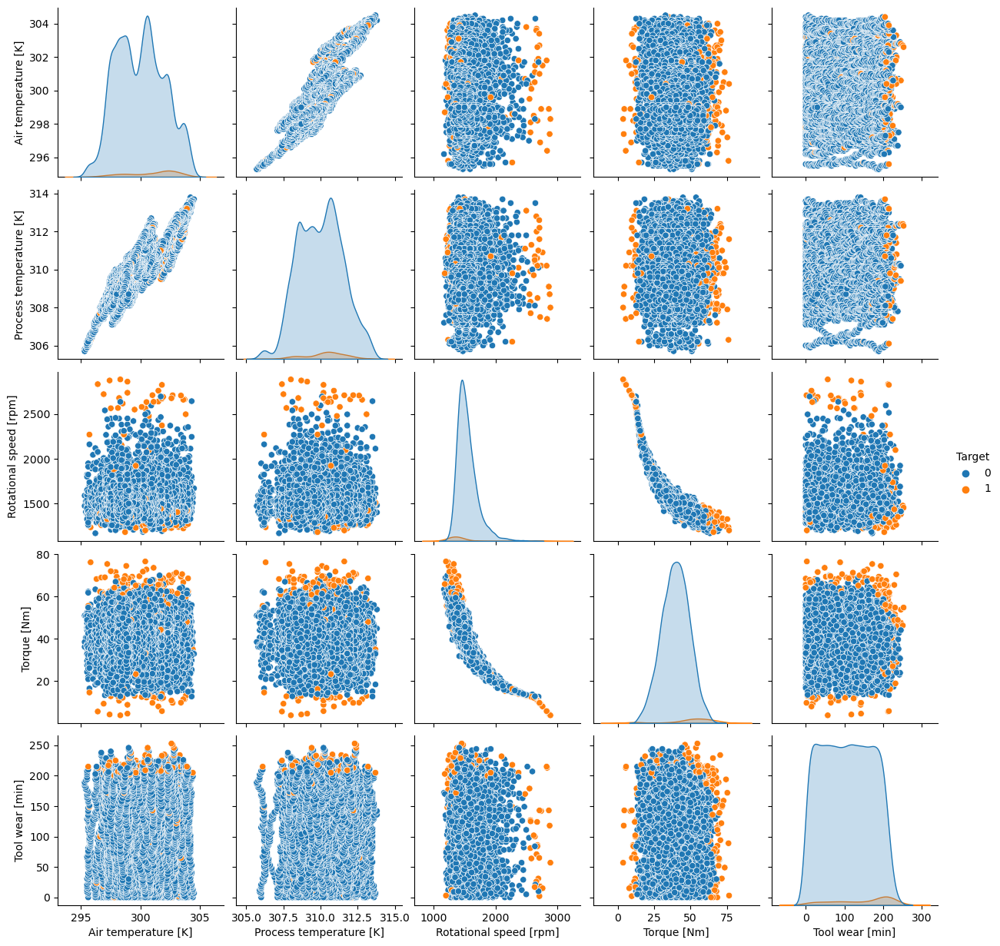

In [25]:
sns.pairplot(df, hue='Target')

### Key observations 


In [26]:
#Torque and rotational speed have high Negative Correlation
#Process temp and air temp have Positive linear correlation
#Failure has happened only at extreme low and high value of Torque and Rotational speed.

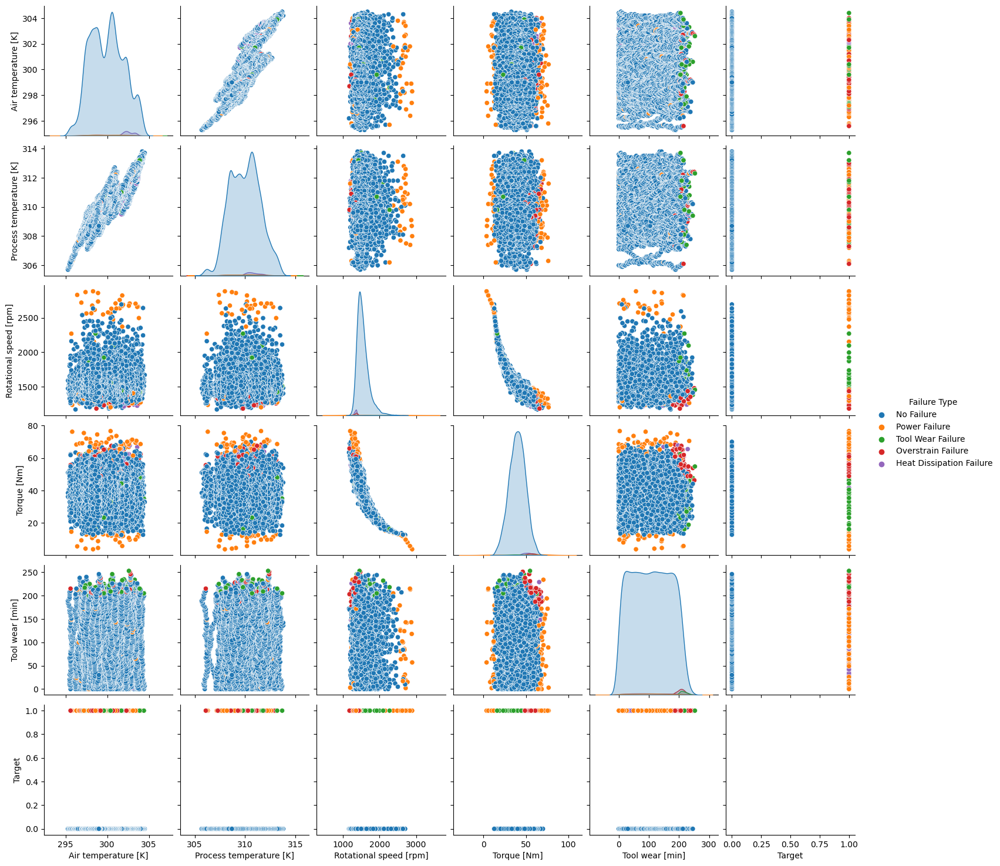

In [27]:
sns.pairplot(df, hue='Failure Type')

In [28]:
# Correlation 
df.corr()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
Air temperature [K],1.000000,0.876068,0.023332,-0.014553,0.014370,0.083066
Process temperature [K],0.876068,1.000000,0.020200,-0.015275,0.013970,0.035997
Rotational speed [rpm],0.023332,0.020200,1.000000,-0.875069,-0.000110,-0.044042
Torque [Nm],-0.014553,-0.015275,-0.875069,1.000000,-0.002552,0.193420
Tool wear [min],0.014370,0.013970,-0.000110,-0.002552,1.000000,0.106337
Target,0.083066,0.035997,-0.044042,0.193420,0.106337,1.000000


<AxesSubplot:>

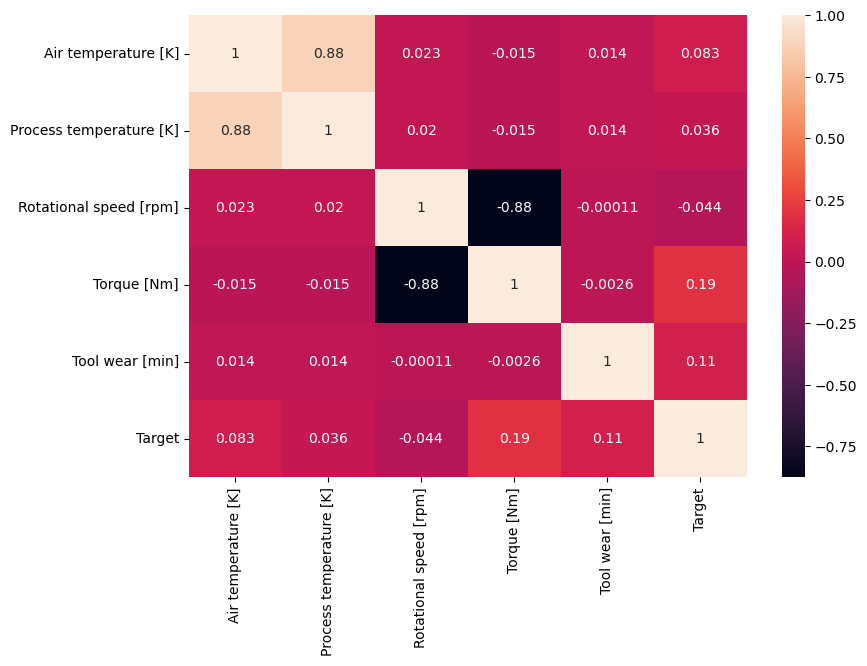

In [29]:
plt.figure(figsize = (9,6))
sns.heatmap(df.corr(),annot=True)

## Failure components of Different Quality components 

In [30]:
df["Type"].value_counts()

L    5984
M    2991
H     998
Name: Type, dtype: int64

Text(0.5, 1.0, 'Percentage of Component type')

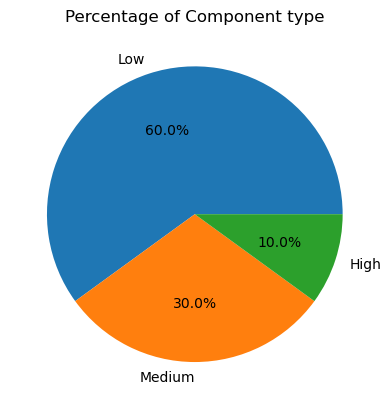

In [31]:
plt.pie(df["Type"].value_counts(), labels=["Low","Medium","High"], autopct="%1.1f%%")
plt.title("Percentage of Component type")

In [32]:
df_product_type=df[df["Type"]=="L"]
df_product_type['Target'].value_counts()

0    5753
1     231
Name: Target, dtype: int64

In [33]:
df_product_type=df[df["Type"]=="M"]
df_product_type['Target'].value_counts()

0    2912
1      79
Name: Target, dtype: int64

In [34]:
df_product_type=df[df["Type"]=="H"]


Text(0.5, 1.0, 'Percentage of Failure w.r.t L')

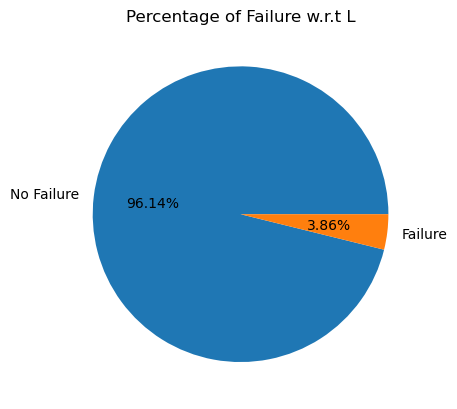

In [35]:
df_product_type=df[df["Type"]=="L"]
plt.pie(df_product_type['Target'].value_counts(),labels=["No Failure", "Failure"], autopct="%1.2f%%")
plt.title("Percentage of Failure w.r.t L")

Text(0.5, 1.0, 'Percentage of Failure w.r.t M')

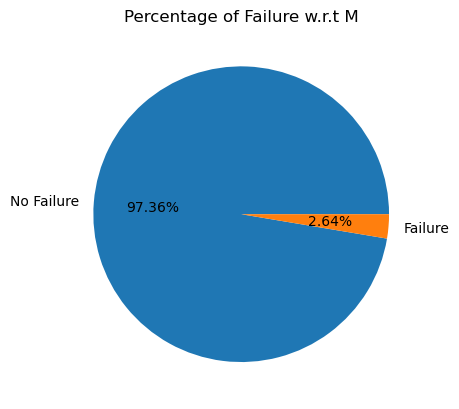

In [36]:
df_product_type=df[df["Type"]=="M"]
plt.pie(df_product_type['Target'].value_counts(),labels=["No Failure", "Failure"], autopct="%1.2f%%")
plt.title("Percentage of Failure w.r.t M")

Text(0.5, 1.0, 'Percentage of Failure w.r.t H')

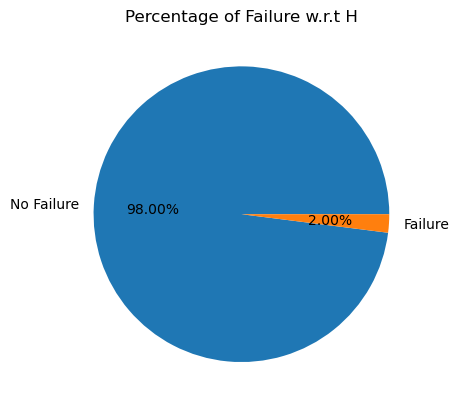

In [37]:
df_product_type=df[df["Type"]=="H"]
plt.pie(df_product_type['Target'].value_counts(),labels=["No Failure", "Failure"], autopct="%1.2f%%")
plt.title("Percentage of Failure w.r.t H")

### Key observations

In [38]:
# L has higher percentage failure than M and H but it's not alarming High

In [39]:
df["Failure Type"].value_counts(normalize = True)

No Failure                  0.966911
Heat Dissipation Failure    0.011230
Power Failure               0.009526
Overstrain Failure          0.007821
Tool Wear Failure           0.004512
Name: Failure Type, dtype: float64

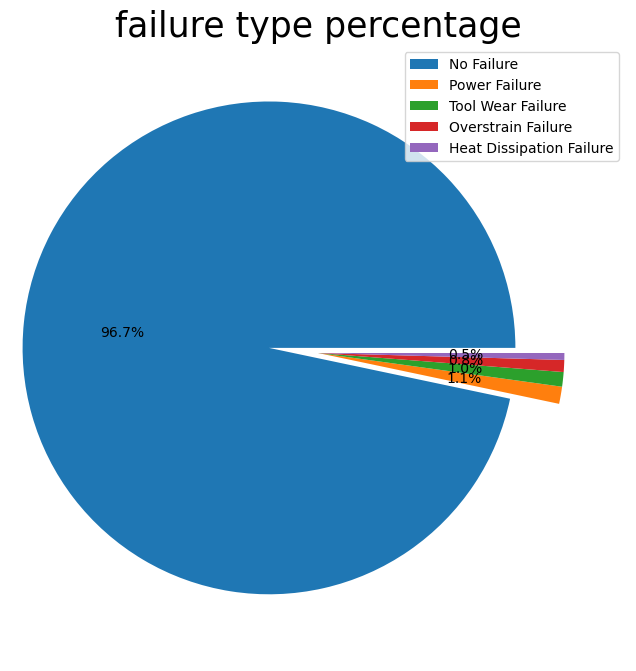

In [40]:
plt.figure(figsize=(8,8))
col_fail_type=df["Failure Type"].unique().tolist()# failure types
plt.pie(df["Failure Type"].value_counts(),explode=(0.2,0.0,0.0,0.0,0.0),autopct="%1.1f%%")
plt.title("failure type percentage",fontsize=25)
plt.legend(col_fail_type,fontsize=10)

In [41]:
df["Failure Type"].unique().tolist()

['No Failure',
 'Power Failure',
 'Tool Wear Failure',
 'Overstrain Failure',
 'Heat Dissipation Failure']

In [42]:
# Rotational speed and Torque are the most imp failure factor 

Text(0.5, 1.0, 'only failure class')

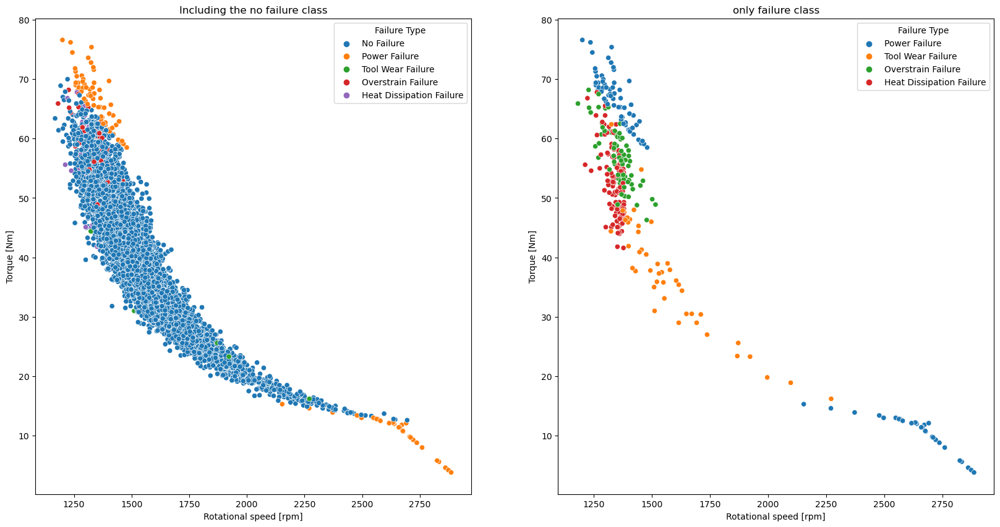

In [43]:
fig,ax=plt.subplots(1,2,figsize=[20,10])
sns.scatterplot(data=df,x="Rotational speed [rpm]",y="Torque [Nm]",hue="Failure Type",ax=ax[0])
sns.scatterplot(data=df[df["Target"]==1],x="Rotational speed [rpm]",y="Torque [Nm]",hue="Failure Type",ax=ax[1])
ax[0].set_title("Including the no failure class")
ax[1].set_title("only failure class")

### Key observations 
- Heat Dissipation has more failure around 10% than other failures 
- Other failures have no significant percentage 

<AxesSubplot:xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

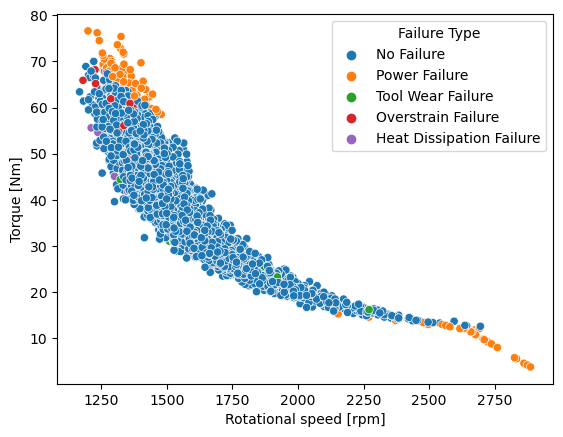

In [44]:
sns.scatterplot(data=df,x="Rotational speed [rpm]",y="Torque [Nm]",hue="Failure Type")

<AxesSubplot:xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

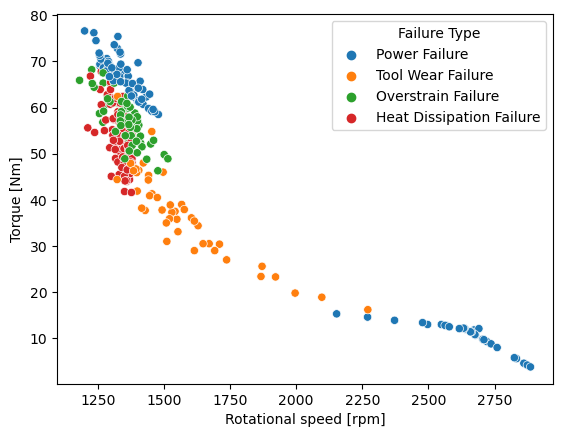

In [45]:
sns.scatterplot(data=df[df["Target"]==1],x="Rotational speed [rpm]",y="Torque [Nm]",hue="Failure Type")

### Outlier Detection - Pre-Processing 

<AxesSubplot:xlabel='Rotational speed [rpm]'>

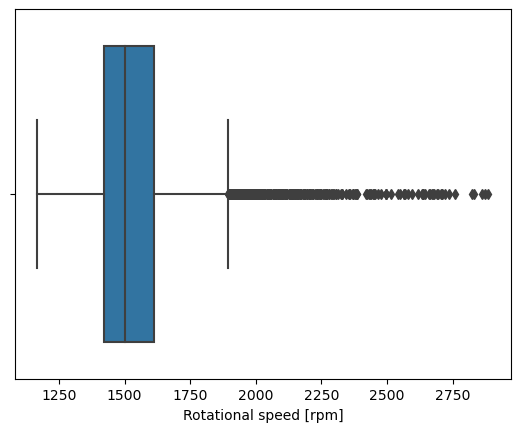

In [46]:
sns.boxplot(data=df,x="Rotational speed [rpm]")

<AxesSubplot:xlabel='Torque [Nm]'>

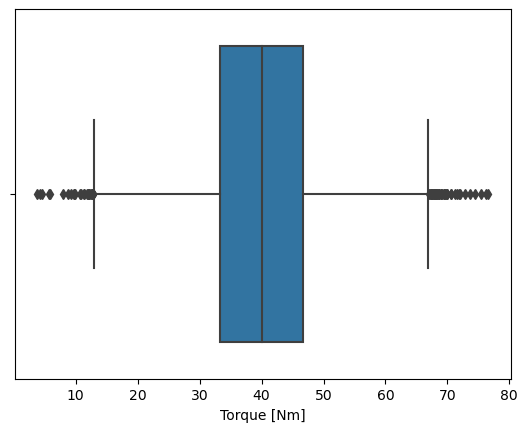

In [47]:
sns.boxplot(data=df,x="Torque [Nm]")

### Key observations 
- Rotational speed has more outliers 
- As of now we are not dealing with Outliers 

In [48]:
df.describe()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
count,9973.000000,9973.000000,9973.000000,9973.000000,9973.000000,9973.000000
mean,300.003259,310.004031,1538.893212,39.978993,107.921087,0.033089
std,2.000548,1.483692,179.412171,9.966805,63.649152,0.178879
min,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000
25%,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000
50%,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000
75%,301.500000,311.100000,1612.000000,46.700000,162.000000,0.000000
max,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9973 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Type                     9973 non-null   object 
 1   Air temperature [K]      9973 non-null   float64
 2   Process temperature [K]  9973 non-null   float64
 3   Rotational speed [rpm]   9973 non-null   int64  
 4   Torque [Nm]              9973 non-null   float64
 5   Tool wear [min]          9973 non-null   int64  
 6   Target                   9973 non-null   int64  
 7   Failure Type             9973 non-null   object 
dtypes: float64(3), int64(3), object(2)
memory usage: 959.3+ KB


In [50]:
df['Type'].unique().tolist()

['M', 'L', 'H']

### Label encoding of  error "Type" 

In [51]:
df['Type']=df['Type'].map({"L": 0, "M":1, "H":2})

In [52]:
df['Type'].unique().tolist()

[1, 0, 2]

In [53]:
df['Type']

0       1
1       0
2       0
3       0
4       0
       ..
9995    1
9996    2
9997    1
9998    2
9999    1
Name: Type, Length: 9973, dtype: int64

In [54]:
df["Failure Type"]=df["Failure Type"].map({'No Failure':0,'Power Failure':1,'Tool Wear Failure':2,
 'Overstrain Failure':3,'Heat Dissipation Failure':4})

In [55]:
df.head(100)

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,298.1,308.6,1551,42.8,0,0,0
1,0,298.2,308.7,1408,46.3,3,0,0
2,0,298.1,308.5,1498,49.4,5,0,0
3,0,298.2,308.6,1433,39.5,7,0,0
4,0,298.2,308.7,1408,40.0,9,0,0
...,...,...,...,...,...,...,...,...
95,1,299.0,309.0,1351,52.2,44,0,0
96,1,299.0,309.0,1575,35.3,47,0,0
97,1,298.9,308.9,1750,29.9,50,0,0
98,0,298.9,308.8,1529,32.7,53,0,0


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9973 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Type                     9973 non-null   int64  
 1   Air temperature [K]      9973 non-null   float64
 2   Process temperature [K]  9973 non-null   float64
 3   Rotational speed [rpm]   9973 non-null   int64  
 4   Torque [Nm]              9973 non-null   float64
 5   Tool wear [min]          9973 non-null   int64  
 6   Target                   9973 non-null   int64  
 7   Failure Type             9973 non-null   int64  
dtypes: float64(3), int64(5)
memory usage: 959.3 KB


### Declaring  Independent and Dependent variables 

In [57]:
X= df.drop(["Target", "Failure Type" ],axis=1)
Y = df['Target']

### Scaling of the Data Set 


In [58]:
from sklearn.preprocessing import RobustScaler

In [59]:
scaler=RobustScaler()
X_scaled=scaler.fit_transform(X)
#print(X_scaled)
X_scaled=pd.DataFrame(X_scaled,columns=X.columns)
X_scaled.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,1.0,-0.62500,-0.652174,0.253968,0.200000,-0.990826
1,0.0,-0.59375,-0.608696,-0.502646,0.459259,-0.963303
2,0.0,-0.62500,-0.695652,-0.026455,0.688889,-0.944954
3,0.0,-0.59375,-0.652174,-0.370370,-0.044444,-0.926606
4,0.0,-0.59375,-0.608696,-0.502646,-0.007407,-0.908257


- Data ia highly imbalanced -- so we need to apply startfied split 

In [60]:
from sklearn.model_selection import train_test_split

In [61]:
X_train,X_test,Y_train,Y_test=train_test_split(X_scaled,Y,train_size=0.80,stratify=Y,random_state=42)

### Model evaluation and Accuracy score comparison

In [62]:
#importing different classification models
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score,f1_score,recall_score,precision_score,roc_auc_score
from sklearn.metrics import classification_report
import joblib as jb

In [63]:
### Creating dictionary for storing different models accuracy
model_comparison={}

### Random Forest Classifier 

In [64]:
RFclassifier=RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
RFclassifier.fit(X_train,Y_train)
Y_pred=RFclassifier.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = RFclassifier, X = X_train, y = Y_train, cv=5)
roc_auc_test_cv = round(cross_val_score(RFclassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
print("roc_auc_test_cv:{:.2f}%".format(roc_auc_test_cv.mean()*100))
model_comparison['Random Forest Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 98.40%
Model F1-Score : 98.54%
Cross Val Accuracy: 98.27 %
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1949
           1       0.61      0.87      0.71        46

    accuracy                           0.98      1995
   macro avg       0.80      0.93      0.85      1995
weighted avg       0.99      0.98      0.99      1995

roc_auc_test_cv:89.46%


### Bagging Classifier

In [65]:
Bagclassifier=BaggingClassifier()
Bagclassifier.fit(X_train,Y_train)
Y_pred=Bagclassifier.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator=Bagclassifier, X=X_train, y=Y_train, cv=5)
roc_auc_test_cv = round(cross_val_score(Bagclassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
print("roc_auc_test_cv:{:.2f}%".format(roc_auc_test_cv.mean()*100))
model_comparison['Bagging Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 98.45%
Model F1-Score : 98.56%
Cross Val Accuracy: 98.42 %
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1946
           1       0.64      0.86      0.73        49

    accuracy                           0.98      1995
   macro avg       0.82      0.92      0.86      1995
weighted avg       0.99      0.98      0.99      1995

roc_auc_test_cv:82.50%


### Naive Bayes

In [66]:
NBclassifier=GaussianNB()
NBclassifier.fit(X_train,Y_train)
Y_pred=NBclassifier.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = NBclassifier, X = X_train, y = Y_train, cv = 5)
roc_auc_test_cv = round(cross_val_score(NBclassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
print("roc_auc_test_cv:{:.2f}%".format(roc_auc_test_cv.mean()*100))
#model_comparison['Naive Bayes Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),roc_auc_test_cv,(accuracies.mean()),(accuracies.std())]
model_comparison['Naive Bayes Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 96.29%
Model F1-Score : 96.97%
Cross Val Accuracy: 96.05 %
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1965
           1       0.17      0.37      0.23        30

    accuracy                           0.96      1995
   macro avg       0.58      0.67      0.61      1995
weighted avg       0.98      0.96      0.97      1995

roc_auc_test_cv:84.05%


### Support Vector Machines 

In [67]:
SVMclassifier=SVC(random_state = 5)
SVMclassifier.fit(X_train,Y_train)
Y_pred=SVMclassifier.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = SVMclassifier, X = X_train, y = Y_train,cv=5)
roc_auc_test_cv = round(cross_val_score(SVMclassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
print("roc_auc_test_cv:{:.2f}%".format(roc_auc_test_cv.mean()*100))
model_comparison['Suppor Vector Machine Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 97.24%
Model F1-Score : 98.15%
Cross Val Accuracy: 97.41 %
              precision    recall  f1-score   support

           0       1.00      0.97      0.99      1982
           1       0.18      0.92      0.30        13

    accuracy                           0.97      1995
   macro avg       0.59      0.95      0.64      1995
weighted avg       0.99      0.97      0.98      1995

roc_auc_test_cv:89.70%


### Decsion Tree 

In [68]:
DTClassifier=DecisionTreeClassifier()
DTClassifier.fit(X_train,Y_train)
Y_pred=DTClassifier.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = DTClassifier, X = X_train, y = Y_train,cv=5)
roc_auc_test_cv = round(cross_val_score(DTClassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
print("roc_auc_test_cv:{:.2f}%".format(roc_auc_test_cv.mean()*100))
model_comparison['Decision Tree Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 97.99%
Model F1-Score : 97.95%
Cross Val Accuracy: 97.83 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1923
           1       0.74      0.68      0.71        72

    accuracy                           0.98      1995
   macro avg       0.87      0.84      0.85      1995
weighted avg       0.98      0.98      0.98      1995

roc_auc_test_cv:74.78%


In [69]:
Model_com_df=pd.DataFrame(model_comparison).T
print(Model_com_df)
Model_com_df.columns=['Model Accuracy','Model F1-Score','CV Accuracy','Roc_Auc']
Model_com_df=Model_com_df.sort_values(by='Model F1-Score',ascending=False)
Model_com_df.style.format("{:.2%}").background_gradient(cmap='Blues')

                                         0         1         2       3
Random Forest Classifier          0.983960  0.985351  0.982702  0.8946
Bagging Classifier                0.984461  0.985576  0.984207  0.8250
Naive Bayes Classifier            0.962907  0.969691  0.960517  0.8405
Suppor Vector Machine Classifier  0.972431  0.981492  0.974054  0.8970
Decision Tree Classifier          0.979950  0.979530  0.978315  0.7478


,Model Accuracy,Model F1-Score,CV Accuracy,Roc_Auc
Bagging Classifier,98.45%,98.56%,98.42%,82.50%
Random Forest Classifier,98.40%,98.54%,98.27%,89.46%
Suppor Vector Machine Classifier,97.24%,98.15%,97.41%,89.70%
Decision Tree Classifier,97.99%,97.95%,97.83%,74.78%
Naive Bayes Classifier,96.29%,96.97%,96.05%,84.05%


## Balancing the Data Set 

### Using SMOTE,ADASYN, BorderlineSMOTE, Oversampler  for the imabalanced Data

In [70]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE,RandomOverSampler,BorderlineSMOTE, ADASYN
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


### Applying  Various ML Algorithm on  balanced dataset

In [71]:
smote=SMOTE()
adasyn=ADASYN()
over=RandomOverSampler()
border=BorderlineSMOTE()

In [72]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score
for model in[RFclassifier,Bagclassifier,NBclassifier,SVMclassifier,DTClassifier]:
    print("=========="*6)
    print("Performance of", model)
    print("=========="*6)
    for balancer in[smote,adasyn,over,border]:
        X_train1,Y_train1=balancer.fit_resample(X_train,Y_train)
        abc=model.fit(X_train1,Y_train1)
        y_pred=abc.predict(X_test)
        cm=confusion_matrix(Y_test,y_pred)
        AS=accuracy_score(Y_test,y_pred)
        CR=classification_report(Y_test,y_pred)
        ROC=roc_auc_score(Y_test,y_pred)
    
    # printing the metrics
        print(model,"using balancer:- ", balancer)
        print("=========="*6)
        print("=========="*6)
        print("Confusion matrix \n" ,cm)
        print("=========="*3)
        print("Accuracy score \n" ,AS)
        print("=========="*3)
        print("CLASSIFICATION REPORT \n" ,CR)
        print("=========="*3)
        print("ROC AUC \n" ,ROC)
        print("=========="*3)

Performance of RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)
RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0) using balancer:-  SMOTE()
Confusion matrix 
 [[1887   42]
 [  14   52]]
Accuracy score 
 0.9719298245614035
CLASSIFICATION REPORT 
               precision    recall  f1-score   support

           0       0.99      0.98      0.99      1929
           1       0.55      0.79      0.65        66

    accuracy                           0.97      1995
   macro avg       0.77      0.88      0.82      1995
weighted avg       0.98      0.97      0.97      1995

ROC AUC 
 0.883052924265988
RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0) using balancer:-  ADASYN()
Confusion matrix 
 [[1889   40]
 [  13   53]]
Accuracy score 
 0.9734335839598998
CLASSIFICATION REPORT 
               precision    recall  f1-score   support

           0       0.99      0.98      0.99      1929
           1       0.57  

## Fine tuning using Hyper Parameters on various Machine Learning Algorithms

### Grid Search CV using Random Forest Classifer 


In [73]:
model_comparison3 = {}

In [74]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [75]:
RFclassifier.get_params

<bound method BaseEstimator.get_params of RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)>

In [76]:
 param_grid = { 
    'n_estimators': [100, 200,300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'min_samples_split':[2,5,10,20],
    'criterion' :['gini', 'entropy']
}

In [77]:
# Instantiate the grid search model
grid_search_cv = GridSearchCV(estimator=RFclassifier, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

### Fitting the Model

In [78]:
%%time
grid_search_cv.fit(X_train,Y_train) 

Fitting 3 folds for each of 360 candidates, totalling 1080 fits
Wall time: 1min 58s


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(criterion='entropy',
                                              n_estimators=10, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [79]:
grid_search_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 200}

In [80]:
grid_search_cv.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=0)

In [81]:
print (f'Accuracy - : {grid_search_cv.score(X_test,Y_test):.3f}')

Accuracy - : 0.982


In [82]:
RFclassifier_finetuned = RFclassifier.set_params(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=0)

In [83]:
RFclassifier_finetuned = RFclassifier_finetuned.fit(X_train,Y_train)
Y_pred = RFclassifier_finetuned.predict(X_test)
print(accuracy_score(Y_test,Y_pred))

0.9824561403508771


In [84]:
Y_pred = RFclassifier_finetuned.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = RFclassifier, X = X_train, y = Y_train, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
model_comparison3['Random Forest']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.25%
Model F1-Score : 98.51%
Cross Val Accuracy: 98.09 %
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1960
           1       0.50      0.94      0.65        35

    accuracy                           0.98      1995
   macro avg       0.75      0.96      0.82      1995
weighted avg       0.99      0.98      0.99      1995



### Using Tuning parametes on Support Vector Machine

In [85]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
grid_search_cv = GridSearchCV(estimator=SVMclassifier, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


### Fitting the model 

In [86]:
%%time
grid_search_cv.fit(X_train,Y_train) 

Fitting 3 folds for each of 25 candidates, totalling 75 fits
Wall time: 2.9 s


GridSearchCV(cv=3, estimator=SVC(random_state=5), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=2)

In [87]:
# print best parameter after tuning
print(grid_search_cv.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid_search_cv.best_estimator_)

{'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}
SVC(C=1000, gamma=0.1, random_state=5)


In [88]:
SVMclassifier_finetuned = SVMclassifier.set_params(C=1000, gamma=0.1, kernel='rbf',random_state=5)

In [89]:
SVMclassifier_finetuned = SVMclassifier_finetuned.fit(X_train,Y_train)

Y_pred = SVMclassifier_finetuned.predict(X_test)
print(accuracy_score(Y_test,Y_pred))

0.981453634085213


In [90]:
Y_pred = SVMclassifier_finetuned.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = SVMclassifier, X = X_train, y = Y_train, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
model_comparison3['Support Vector Machine']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.15%
Model F1-Score : 98.23%
Cross Val Accuracy: 98.48 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1940
           1       0.64      0.76      0.69        55

    accuracy                           0.98      1995
   macro avg       0.81      0.88      0.84      1995
weighted avg       0.98      0.98      0.98      1995



### Using Tuning parametes on Decison Tree

In [91]:
 # Create the parameter grid based on Decsion tree
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion' : ['gini', 'entropy']
    }

In [92]:
# Instantiate the grid search model
grid_search_cv = GridSearchCV(estimator=DTClassifier, param_grid = params, 
                           cv=3, n_jobs = -1, verbose = 2)

### Fitting the model 

In [93]:
%%time
grid_search_cv.fit(X_train,Y_train) 

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Wall time: 391 ms


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             verbose=2)

In [94]:
# print best parameter after tuning
print(grid_search_cv.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid_search_cv.best_estimator_)

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 5}
DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=5)


In [95]:
DTClassifier_finetuned =  DTClassifier.set_params(criterion='entropy', max_depth=10, min_samples_leaf=5)

In [96]:
DTClassifier_finetuned = DTClassifier_finetuned.fit(X_train,Y_train)

Y_pred = DTClassifier_finetuned.predict(X_test)
print(accuracy_score(Y_test,Y_pred))

0.9869674185463659


In [97]:
Y_pred = DTClassifier_finetuned.predict(X_test)
print(f"Model Accuracy : {accuracy_score(Y_pred,Y_test)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred,Y_test,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = DTClassifier, X = X_train, y = Y_train, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test,zero_division=1))
model_comparison3['Decision Tree']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.70%
Model F1-Score : 98.72%
Cross Val Accuracy: 98.12 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1933
           1       0.77      0.82      0.80        62

    accuracy                           0.99      1995
   macro avg       0.88      0.91      0.90      1995
weighted avg       0.99      0.99      0.99      1995



# Model Comparison after Hyper Parameter Tuning 

In [98]:
Model_com_df=pd.DataFrame(model_comparison3).T
Model_com_df.columns=['Model Accuracy','Model F1-Score','CV Accuracy']
Model_com_df=Model_com_df.sort_values(by='Model F1-Score',ascending=False)
Model_com_df.style.format("{:.2%}").background_gradient(cmap='gist_rainbow_r')

,Model Accuracy,Model F1-Score,CV Accuracy
Decision Tree,98.70%,98.72%,98.12%
Random Forest,98.25%,98.51%,98.09%
Support Vector Machine,98.15%,98.23%,98.48%


# Declaring Independent and Dependent variables ["Failure type"]

In [99]:
df1 = df.copy()

In [100]:
X= df1.drop(["Target", "Failure Type" ],axis=1)
Y = df1['Failure Type']

### Automaated EDA from Dataprep 

  0%|          | 0/374 [00:00<?, ?it/s]


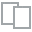
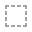
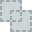
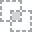
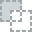
...
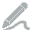
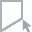
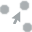
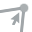
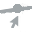

In [101]:
from dataprep.eda import plot
plot(df1)

## Scaling of Data 

In [102]:
scaler=RobustScaler()
X_Scaled=scaler.fit_transform(X)
#print(X_scaled)
X_Scaled=pd.DataFrame(X_Scaled,columns=X.columns)
X_Scaled.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,1.0,-0.62500,-0.652174,0.253968,0.200000,-0.990826
1,0.0,-0.59375,-0.608696,-0.502646,0.459259,-0.963303
2,0.0,-0.62500,-0.695652,-0.026455,0.688889,-0.944954
3,0.0,-0.59375,-0.652174,-0.370370,-0.044444,-0.926606
4,0.0,-0.59375,-0.608696,-0.502646,-0.007407,-0.908257


In [103]:
X_train_FT,X_test_FT,Y_train_FT,Y_test_FT =train_test_split(X_scaled,Y,train_size=0.80,stratify=Y,random_state=42)

In [104]:
import warnings 
warnings.filterwarnings("ignore")

In [105]:
model_comparison1 = {}

## Random Forest Classfier 

In [106]:
RFclassifier_FT=RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
RFclassifier_FT.fit(X_train_FT,Y_train_FT)
Y_pred_FT=RFclassifier.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = RFclassifier_FT, X = X_train_FT, y = Y_train_FT, cv=5)
#roc_auc_test_cv = round(cross_val_score(DTClassifier, X, Y, cv=5, n_jobs=-1, scoring="roc_auc").mean(),4)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred,Y_test_FT,zero_division=1))
#print("ROC_AUC_Test_CV: {:.2f} %".format(roc_auc_test_cv.mean()*100))
model_comparison1['Random Forest Classifier']=[accuracy_score(Y_pred,Y_test),f1_score(Y_pred,Y_test,average='weighted'),(accuracies.mean()),roc_auc_test_cv]

Model Accuracy : 97.44%
Model F1-Score : 98.19%
Cross Val Accuracy: 98.12 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1933
           1       0.89      0.27      0.42        62
           2       0.00      1.00      0.00         0
           3       0.00      1.00      0.00         0
           4       0.00      1.00      0.00         0

    accuracy                           0.97      1995
   macro avg       0.38      0.85      0.28      1995
weighted avg       0.99      0.97      0.98      1995



## Bagging Classifier 

In [107]:
Bagclassifier_FT=BaggingClassifier()
Bagclassifier_FT.fit(X_train_FT,Y_train_FT)
Y_pred_FT=Bagclassifier_FT.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator=Bagclassifier_FT, X=X_train_FT, y=Y_train_FT, cv=5)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison1['Bagging Classifier']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean()),(accuracies.std())]

Model Accuracy : 98.60%
Model F1-Score : 98.92%
Cross Val Accuracy: 98.36 %
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1948
           1       0.68      1.00      0.81        13
           2       0.00      1.00      0.00         0
           3       0.44      0.78      0.56         9
           4       1.00      0.88      0.94        25

    accuracy                           0.99      1995
   macro avg       0.62      0.93      0.66      1995
weighted avg       0.99      0.99      0.99      1995



## Naive Bayes Classifer

In [108]:
NBclassifier_FT=GaussianNB()
NBclassifier_FT.fit(X_train_FT,Y_train_FT)
Y_pred_FT=NBclassifier_FT.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = NBclassifier_FT, X = X_train_FT, y = Y_train_FT, cv = 5)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison1['Naive Bayes']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean()),(accuracies.std())]

Model Accuracy : 95.54%
Model F1-Score : 95.25%
Cross Val Accuracy: 95.15 %
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1898
           1       0.32      0.23      0.27        26
           2       0.00      1.00      0.00         0
           3       0.81      0.52      0.63        25
           4       0.73      0.35      0.47        46

    accuracy                           0.96      1995
   macro avg       0.57      0.62      0.47      1995
weighted avg       0.95      0.96      0.95      1995



## Support Vector Maching Classifier

In [109]:
SVMclassifier_FT=SVC(random_state = 5)
SVMclassifier_FT.fit(X_train_FT,Y_train_FT)
Y_pred_FT=SVMclassifier_FT.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = SVMclassifier_FT, X = X_train_FT, y = Y_train_FT,cv=5)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison1['Support Vector Machine']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean()),(accuracies.std())]

Model Accuracy : 97.59%
Model F1-Score : 98.44%
Cross Val Accuracy: 97.18 %
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1977
           1       0.53      1.00      0.69        10
           2       0.00      1.00      0.00         0
           3       0.44      1.00      0.61         7
           4       0.05      1.00      0.09         1

    accuracy                           0.98      1995
   macro avg       0.40      1.00      0.47      1995
weighted avg       1.00      0.98      0.98      1995



## Decision Tree Classifier 

In [110]:
DTClassifier_FT=DecisionTreeClassifier()
DTClassifier_FT.fit(X_train_FT,Y_train_FT)
Y_pred_FT=DTClassifier_FT.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = DTClassifier_FT, X = X_train_FT, y = Y_train_FT,cv=5)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison1['Decision Tree']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean()),(accuracies.std())]

Model Accuracy : 98.25%
Model F1-Score : 98.25%
Cross Val Accuracy: 97.98 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1931
           1       0.74      1.00      0.85        14
           2       0.11      0.10      0.11        10
           3       0.62      0.71      0.67        14
           4       1.00      0.85      0.92        26

    accuracy                           0.98      1995
   macro avg       0.69      0.73      0.71      1995
weighted avg       0.98      0.98      0.98      1995



In [111]:
Model_com_df1=pd.DataFrame(model_comparison1).T
Model_com_df1.columns=['Model Accuracy','Model F1-Score','CV Accuracy','CV std']
Model_com_df1=Model_com_df1.sort_values(by='Model F1-Score',ascending=False)
Model_com_df1.style.format("{:.2%}").background_gradient(cmap='nipy_spectral')

,Model Accuracy,Model F1-Score,CV Accuracy,CV std
Bagging Classifier,98.60%,98.92%,98.36%,0.23%
Random Forest Classifier,98.70%,98.72%,98.12%,74.78%
Support Vector Machine,97.59%,98.44%,97.18%,0.08%
Decision Tree,98.25%,98.25%,97.98%,0.26%
Naive Bayes,95.54%,95.25%,95.15%,0.50%


## Applying various Sampling Techniques ["Failure Type "]

In [112]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score
for model in[RFclassifier,Bagclassifier,NBclassifier,SVMclassifier,DTClassifier]:
    print("=========="*6)
    print("Performance of", model)
    print("=========="*6)
    for balancer in[smote,adasyn,over,border]:
        X_train1,Y_train1=balancer.fit_resample(X_train_FT,Y_train_FT)
        abc=model.fit(X_train1,Y_train1)
        y_pred_FT=abc.predict(X_test_FT)
        cm=confusion_matrix(Y_test_FT,y_pred_FT)
        AS=accuracy_score(Y_test_FT,y_pred_FT)
        CR=classification_report(Y_test_FT,y_pred_FT)
        #ROC=roc_auc_score(Y_test_FT,y_pred_FT)
    
    # printing the metrics
        print(model,"using balancer:- ", balancer)
        print("=========="*6)
        print("=========="*6)
        print("Confusion matrix \n" ,cm)
        print("=========="*3)
        print("Accuracy score \n" ,AS)
        print("=========="*3)
        print("CLASSIFICATION REPORT \n" ,CR)
        print("=========="*3)
        #print("ROC AUC \n" ,ROC)
        print("=========="*3)

Performance of RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=0)
RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=0) using balancer:-  SMOTE()
Confusion matrix 
 [[1786   10   96   15   22]
 [   4   15    0    0    0]
 [   2    0    6    1    0]
 [   0    0    1   15    0]
 [   0    0    0    0   22]]
Accuracy score 
 0.9243107769423559
CLASSIFICATION REPORT 
               precision    recall  f1-score   support

           0       1.00      0.93      0.96      1929
           1       0.60      0.79      0.68        19
           2       0.06      0.67      0.11         9
           3       0.48      0.94      0.64        16
           4       0.50      1.00      0.67        22

    accuracy                           0.92      1995
   macro avg       0.53      0.86      0.61      1995
weighted avg       0.98      0.92      0.95      1995

RandomForestClassifier

## Applying Hyper Parameters for ["Failure Type"]

### Grid Search CV using Random Forest Classifer 

In [113]:
model_comparison4 = {}

In [114]:
  param_grid = { 
    'n_estimators': [100, 200,300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'min_samples_split':[2,5,10,20],
    'criterion' :['gini', 'entropy']
}

In [115]:
# Instantiate the grid search model
grid_search_cv = GridSearchCV(estimator=RFclassifier, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [116]:
%%time
grid_search_cv.fit(X_train_FT,Y_train_FT)

Fitting 3 folds for each of 360 candidates, totalling 1080 fits
Wall time: 2min 6s


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(criterion='entropy', max_depth=8,
                                              n_estimators=200,
                                              random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [117]:
grid_search_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 300}

In [118]:
print (f'Accuracy - : {grid_search_cv.score(X_test_FT,Y_test_FT):.3f}')

Accuracy - : 0.981


In [119]:
RFclassifier_finetuned = RFclassifier.set_params(criterion='entropy',
 max_depth= 8,
 max_features= 'auto',
 min_samples_split= 2,
 n_estimators= 300)

In [120]:
RFclassifier_finetuned = RFclassifier_finetuned.fit(X_train_FT,Y_train_FT)
Y_pred_FT = RFclassifier_finetuned.predict(X_test_FT)
print(accuracy_score(Y_test_FT,Y_pred_FT))

0.981453634085213


In [121]:
Y_pred = RFclassifier_finetuned.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = RFclassifier, X = X_train_FT, y = Y_train_FT, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison4['Random Forest']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.15%
Model F1-Score : 98.63%
Cross Val Accuracy: 97.96 %
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1966
           1       0.58      1.00      0.73        11
           2       0.00      1.00      0.00         0
           3       0.69      1.00      0.81        11
           4       0.32      1.00      0.48         7

    accuracy                           0.98      1995
   macro avg       0.52      1.00      0.60      1995
weighted avg       0.99      0.98      0.99      1995



## Grid Search CV using Support Vector Machine

In [122]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 

In [123]:
grid_search_cv = GridSearchCV(estimator=SVMclassifier, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [124]:
%%time
grid_search_cv.fit(X_train_FT,Y_train_FT)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
Wall time: 4.54 s


GridSearchCV(cv=3, estimator=SVC(C=1000, gamma=0.1, random_state=5), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=2)

In [125]:
grid_search_cv.best_params_

{'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}

In [126]:
SVMclassifier_finetuned = SVMclassifier.set_params(C=1000, gamma=0.1, kernel='rbf')

In [127]:
SVMclassifier_finetuned = SVMclassifier_finetuned.fit(X_train_FT,Y_train_FT)

In [128]:
Y_pred_FT = SVMclassifier_finetuned.predict(X_test_FT)
print(accuracy_score(Y_test_FT,Y_pred_FT))

0.9859649122807017


In [129]:
Y_pred = SVMclassifier_finetuned.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = SVMclassifier, X = X_train_FT, y = Y_train_FT, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison4['Support Vector Machine']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.60%
Model F1-Score : 98.82%
Cross Val Accuracy: 98.60 %
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1938
           1       0.79      0.88      0.83        17
           2       0.00      1.00      0.00         0
           3       0.88      0.88      0.88        16
           4       0.82      0.75      0.78        24

    accuracy                           0.99      1995
   macro avg       0.70      0.90      0.70      1995
weighted avg       0.99      0.99      0.99      1995



In [130]:
 # Create the parameter grid based on Decsion tree
param_grid= {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion' : ['gini', 'entropy']
    }

In [131]:
grid_search_cv = GridSearchCV(estimator=DTClassifier, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [132]:
%%time
grid_search_cv.fit(X_train_FT,Y_train_FT)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Wall time: 522 ms


GridSearchCV(cv=3,
             estimator=DecisionTreeClassifier(criterion='entropy', max_depth=10,
                                              min_samples_leaf=5),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             verbose=2)

In [133]:
grid_search_cv.best_params_

{'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 5}

In [134]:
grid_search_cv.best_estimator_

DecisionTreeClassifier(max_depth=20, min_samples_leaf=5)

In [135]:
print (f'Accuracy - : {grid_search_cv.score(X_test_FT,Y_test_FT):.3f}')

Accuracy - : 0.983


In [136]:
DTClassifier_finetuned = DTClassifier.set_params(criterion = 'gini',max_depth=20, min_samples_leaf=5)

In [137]:
DTClassifier_finetuned = DTClassifier_finetuned.fit(X_train_FT,Y_train_FT)
Y_pred_FT = DTClassifier_finetuned.predict(X_test_FT)
print(accuracy_score(Y_test_FT,Y_pred_FT))

0.9829573934837093


In [138]:
Y_pred = DTClassifier_finetuned.predict(X_test_FT)
print(f"Model Accuracy : {accuracy_score(Y_pred_FT,Y_test_FT)*100:.2f}%")
print(f"Model F1-Score : {f1_score(Y_pred_FT,Y_test_FT,average='weighted')*100:.2f}%")
accuracies = cross_val_score(estimator = DTClassifier, X = X_train_FT, y = Y_train_FT, cv = 10)
print("Cross Val Accuracy: {:.2f} %".format(accuracies.mean()*100))
print(classification_report(Y_pred_FT,Y_test_FT,zero_division=1))
model_comparison4['Decison Tree']=[accuracy_score(Y_pred_FT,Y_test_FT),f1_score(Y_pred_FT,Y_test_FT,average='weighted'),(accuracies.mean())]

Model Accuracy : 98.30%
Model F1-Score : 98.46%
Cross Val Accuracy: 98.07 %
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1938
           1       0.68      1.00      0.81        13
           2       0.11      0.33      0.17         3
           3       0.50      0.62      0.55        13
           4       1.00      0.79      0.88        28

    accuracy                           0.98      1995
   macro avg       0.66      0.74      0.68      1995
weighted avg       0.99      0.98      0.98      1995



In [139]:
Model_com_df1=pd.DataFrame(model_comparison4).T
Model_com_df1.columns=['Model Accuracy','Model F1-Score','CV Accuracy']
Model_com_df1=Model_com_df1.sort_values(by='Model F1-Score',ascending=False)
Model_com_df1.style.format("{:.2%}").background_gradient(cmap='rainbow')

,Model Accuracy,Model F1-Score,CV Accuracy
Support Vector Machine,98.60%,98.82%,98.60%
Random Forest,98.15%,98.63%,97.96%
Decison Tree,98.30%,98.46%,98.07%
